In [6]:
import datetime
from tensorflow.keras.models import load_model
import numpy as np
import pandas as pd
from trading_strategy import TradingStrategy
from data_preparation import load_data, preprocess_and_save_data, create_sequences
import yaml
import pickle
import matplotlib.pyplot as plt

In [8]:
with open('settings.yml', 'r') as f:
    dat = yaml.load(f, Loader=yaml.SafeLoader)

In [9]:
def calc_return(data):
    """
    Amount of profit generated by going long or short with 1 lot/share
    """
    pr = 0
    for i in range(data.shape[0]):
        if (data.position.iloc[i]!=0)&(data.position.iloc[i-1]==0): #Enter trade
            temp = data.close.iloc[i]
        elif (data.position.iloc[i]==0)&(data.position.iloc[i-1]!=0): #Close trade
            if data.position.iloc[i-1]==-1:
                pr += temp - data.close.iloc[i]
            elif data.position.iloc[i-1]==1:
                pr += data.close.iloc[i] - temp
    return pr

In [13]:
datas = []
for stock in dat['stocks']:
    input_filename = f'/Users/aditya/psr_v1/data/raw/{stock}_intraday_1min.csv'
    data = load_data(input_filename)
    with open(f'/Users/aditya/psr_v1/{stock}_scaler.pkl','rb') as ip:
        scaler = pickle.load(ip)
    sequence_length = dat['prediction_duration'] + dat['training_duration']
    num_features = dat['num_features']
    processed_data = preprocess_and_save_data(data,stock)
    # Now create the sequences from the processed data
    sequences = create_sequences(processed_data.values, sequence_length, num_features)
    X = sequences[:, :dat['training_duration'], :]
    model_path = '/Users/aditya/psr_v1/lstm_model_v3.keras'
    model = load_model(model_path)
    yhat = model.predict(X)
    data = data.join(pd.DataFrame(scaler.inverse_transform(yhat),
    columns=[f'pred_{x}' for x in data.columns],
    index=data.index[dat['training_duration']-1:-dat['prediction_duration']]))
    data = data.sort_index()
    data['signal'] = 0
    data['signal'] = data.apply(lambda x: (x['pred_close']>1.01*x['close'])*1,axis=1)
    data['signal'] = data.apply(lambda x: (x['pred_close']<0.99*x['close'])*-1,axis=1)
    data['position'] = 0
    for i in range(1,data.shape[0]):
        if data['position'].iloc[i-1]==0:
            if data.signal.iloc[i]==1:
                data['position'].iloc[i]=1
            elif data.signal.iloc[i]==-1:
                data['position'].iloc[i]=-1
        elif data['position'].iloc[i-1]==1:
            if (data.signal.iloc[i]==-1)or((data.index[i].hour==19)and(data.index[i].minute==59)):
                data['position'].iloc[i]=0
            else:
                data['position'].iloc[i]=1
        else:
            if (data.signal.iloc[i]==1)or((data.index[i].hour==19)and(data.index[i].minute==59)):
                data['position'].iloc[i]=0
            else:
                data['position'].iloc[i]=-1
    print(f'returns stock_{stock}: {calc_return(data)}')
    datas.append(data)


INFO:root:Data loaded successfully from /Users/aditya/psr_v1/data/raw/META_intraday_1min.csv
2024-05-30 00:15:04.836808: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2024-05-30 00:15:04.843520: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2024-05-30 00:15:04.847465: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting

425/425 [==============================] - 6s 10ms/step


/var/folders/v4/cnt9dtq11m9dng9st3scwvt00000gn/T/ipykernel_39037/3838088632.py:29: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  data['position'].iloc[i]=-1
/var/folders/v4/cnt9dtq11m9dng9st3scwvt00000gn/T/ipykernel_39037/3838088632.py:29: S

returns stock_META: 22.253000000000043


2024-05-30 00:15:15.779262: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2024-05-30 00:15:15.782227: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2024-05-30 00:15:15.786093: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

449/449 [==============================] - 5s 9ms/step


/var/folders/v4/cnt9dtq11m9dng9st3scwvt00000gn/T/ipykernel_39037/3838088632.py:29: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  data['position'].iloc[i]=-1
/var/folders/v4/cnt9dtq11m9dng9st3scwvt00000gn/T/ipykernel_39037/3838088632.py:29: S

returns stock_TSLA: 39.196999999999974


2024-05-30 00:15:25.123910: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2024-05-30 00:15:25.126338: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2024-05-30 00:15:25.129593: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

434/434 [==============================] - 5s 8ms/step


/var/folders/v4/cnt9dtq11m9dng9st3scwvt00000gn/T/ipykernel_39037/3838088632.py:29: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  data['position'].iloc[i]=-1
/var/folders/v4/cnt9dtq11m9dng9st3scwvt00000gn/T/ipykernel_39037/3838088632.py:29: S

returns stock_AMZN: 20.570999999999998


2024-05-30 00:15:31.918718: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2024-05-30 00:15:31.926851: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2024-05-30 00:15:31.927877: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

443/443 [==============================] - 4s 8ms/step


ERROR:root:File not found: /Users/aditya/psr_v1/data/raw/NVDA_intraday_1min.csv


returns stock_MSFT: 0


FileNotFoundError: [Errno 2] No such file or directory: '/Users/aditya/psr_v1/NVDA_scaler.pkl'

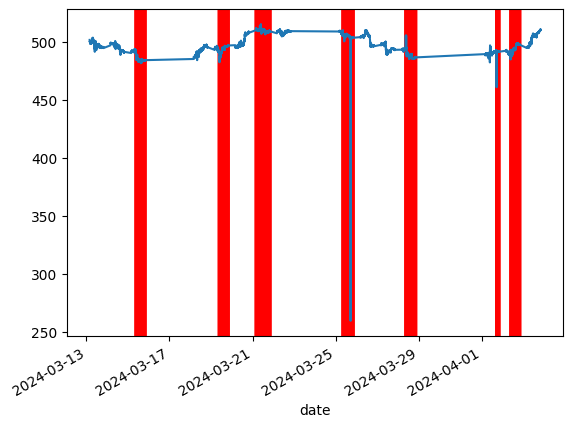

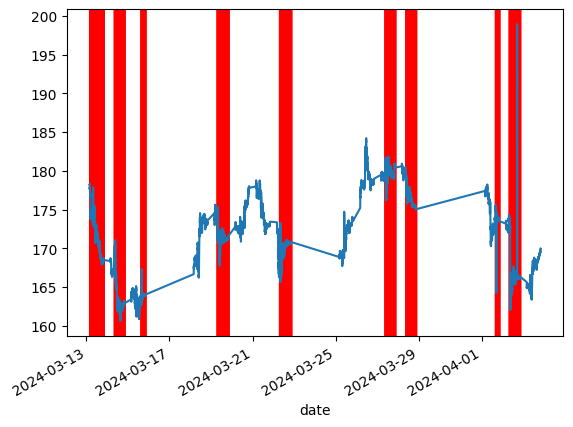

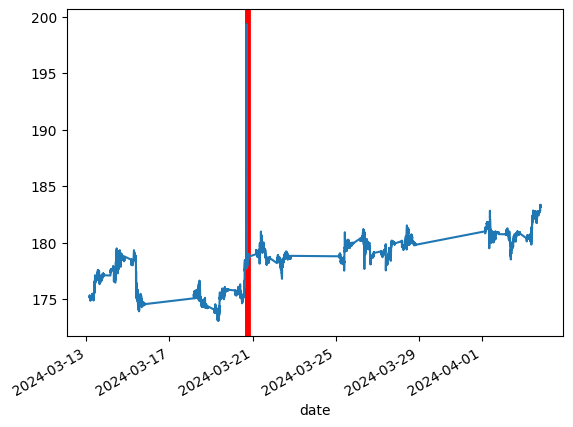

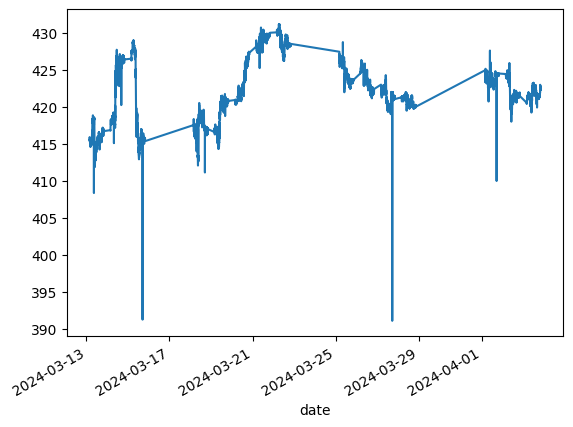

In [15]:
for data in datas:
    for i in range(data[data.position==-1].shape[0]):
        plt.axvline(x=data[data.position==-1].index[i],color='r')
    for i in range(data[data.position==1].shape[0]):
        plt.axvline(x=data[data.position==1].index[i],color='g')
    data.close.plot()
    plt.show()